# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

由于 CelebA 数据集比较复杂，而且这是你第一次使用 GANs。我们想让你先在 MNIST 数据集上测试你的 GANs 模型，以让你更快的评估所建立模型的性能。

如果你在使用 [FloydHub](https://www.floydhub.com/), 请将 `data_dir` 设置为 "/input" 并使用 [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## 探索数据（Explore the Data）
### MNIST
[MNIST](http://yann.lecun.com/exdb/mnist/) 是一个手写数字的图像数据集。你可以更改 `show_n_images` 探索此数据集。

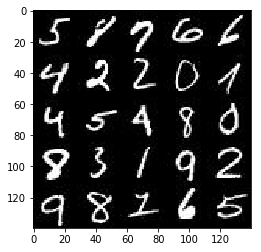

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')


### CelebA
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) 是一个包含 20 多万张名人图片及相关图片说明的数据集。你将用此数据集生成人脸，不会用不到相关说明。你可以更改 `show_n_images` 探索此数据集。

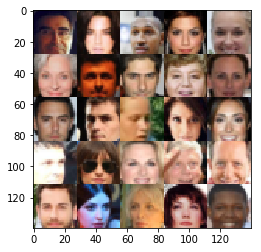

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）
由于该项目的重点是建立 GANs 模型，我们将为你预处理数据。

经过数据预处理，MNIST 和 CelebA 数据集的值在 28×28 维度图像的 [-0.5, 0.5] 范围内。CelebA 数据集中的图像裁剪了非脸部的图像部分，然后调整到 28x28 维度。

MNIST 数据集中的图像是单[通道](https://en.wikipedia.org/wiki/Channel_(digital_image%29)的黑白图像，CelebA 数据集中的图像是 [三通道的 RGB 彩色图像](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images)。

## 建立神经网络（Build the Neural Network）
你将通过部署以下函数来建立 GANs 的主要组成部分:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### 检查 TensorFlow 版本并获取 GPU 型号
检查你是否使用正确的 TensorFlow 版本，并获取 GPU 型号

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### 输入（Input）
部署 `model_inputs` 函数以创建用于神经网络的 [占位符 (TF Placeholders)](https://www.tensorflow.org/versions/r0.11/api_docs/python/io_ops/placeholders)。请创建以下占位符：
- 输入图像占位符: 使用 `image_width`，`image_height` 和 `image_channels` 设置为 rank 4。
- 输入 Z 占位符: 设置为 rank 2，并命名为 `z_dim`。
- 学习速率占位符: 设置为 rank 0。

返回占位符元组的形状为 (tensor of real input images, tensor of z data, learning rate)。


In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='z_dim')
    learning_rate = tf.placeholder(tf.float32, name='lr')
    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### 辨别器（Discriminator）
部署 `discriminator` 函数创建辨别器神经网络以辨别 `images`。该函数应能够重复使用神经网络中的各种变量。 在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "discriminator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回形如 (tensor output of the discriminator, tensor logits of the discriminator) 的元组。

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    dropout = 0.5
    with tf.variable_scope('discriminator', reuse=reuse): 
        # 28x28x3
        # Xavier可以加快模型收敛,有可能使模型收敛到更低的loss
        initializer=tf.contrib.layers.xavier_initializer()
        x = tf.layers.conv2d(images, 64, 5, strides=2, padding='same', kernel_initializer=initializer)
        x = tf.maximum(alpha * x, x)
        x = tf.nn.dropout(x, dropout)
        # 14x14x64
        
        x = tf.layers.conv2d(x, 128, 5, strides=2, padding='same', kernel_initializer=initializer)
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        x = tf.nn.dropout(x, dropout)
        # 7x7x128
        
        x = tf.layers.conv2d(x, 256, 5, strides=2, padding='same', kernel_initializer=initializer)
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        x = tf.nn.dropout(x, dropout)
        # 4x4x256

        x = tf.layers.conv2d(x, 512, 5, strides=1, padding='same', kernel_initializer=initializer)
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        x = tf.nn.dropout(x, dropout)
        # 4x4x512
        
        x = tf.reshape(x, (-1, 4*4*512))
        logits = tf.layers.dense(x, 1)
        outputs = tf.sigmoid(logits)
        
    return logits, outputs


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### 生成器（Generator）
部署 `generator` 函数以使用 `z` 生成图像。该函数应能够重复使用神经网络中的各种变量。
在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "generator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回所生成的 28 x 28 x `out_channel_dim` 维度图像。

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.25
    with tf.variable_scope('generator', reuse=(not is_train)):
        x = tf.layers.dense(z, 7*7*256)
        x = tf.reshape(x, (-1, 7, 7, 256))
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        x = tf.nn.dropout(x, 0.4)
        # 7x7x256
        
        x = tf.layers.conv2d_transpose(x, 128, 5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        # 14x14x128
        
        x = tf.layers.conv2d_transpose(x, 64, 5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        # 28x28x64

        x = tf.layers.conv2d_transpose(x, 32, 5, strides=1, padding='same')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        # 28x28x32
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x, out_channel_dim, 5, strides=1, padding='same')
        # 28x28x3
        
        outputs = tf.tanh(logits)
        
        return outputs
    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### 损失函数（Loss）
部署 `model_loss` 函数训练并计算 GANs 的损失。该函数应返回形如 (discriminator loss, generator loss) 的元组。

使用你已实现的函数：
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_logits_real, d_model_real = discriminator(input_real)
    d_logits_fake, d_model_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*0.9))
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    return  d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### 优化（Optimization）
部署 `model_opt` 函数实现对 GANs 的优化。使用 [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) 获取可训练的所有变量。通过变量空间名 `discriminator` 和 `generator` 来过滤变量。该函数应返回形如 (discriminator training operation, generator training operation) 的元组。

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## 训练神经网络（Neural Network Training）
### 输出显示
使用该函数可以显示生成器 (Generator) 在训练过程中的当前输出，这会帮你评估 GANs 模型的训练程度。

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练
部署 `train` 函数以建立并训练 GANs 模型。记得使用以下你已完成的函数：
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

使用 `show_generator_output` 函数显示 `generator` 在训练过程中的输出。

**注意**：在每个批次 (batch) 中运行 `show_generator_output` 函数会显著增加训练时间与该 notebook 的体积。推荐每 100 批次输出一次 `generator` 的输出。 

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, lr= model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])    
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    losses = []
    steps = 0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                batch_images = batch_images*2
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})

                if steps % 50 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
        
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                    losses.append((train_loss_d, train_loss_g))

                if steps % 100 == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
                    
    return losses

### MNIST
在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。

In [3]:
batch_size = 32
z_dim = 100
learning_rate = 0.001
beta1 = 0.9


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))

with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, 
          mnist_dataset.get_batches, mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它。

Epoch 1/3... Discriminator Loss: 1.2607... Generator Loss: 0.8693
Epoch 1/3... Discriminator Loss: 1.3539... Generator Loss: 1.4832


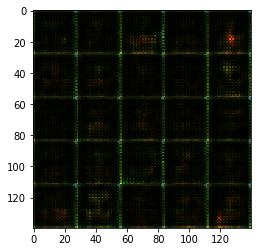

Epoch 1/3... Discriminator Loss: 0.7858... Generator Loss: 1.8729
Epoch 1/3... Discriminator Loss: 1.4919... Generator Loss: 1.0105


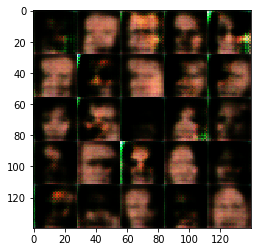

Epoch 1/3... Discriminator Loss: 1.5040... Generator Loss: 1.7571
Epoch 1/3... Discriminator Loss: 1.3021... Generator Loss: 1.0451


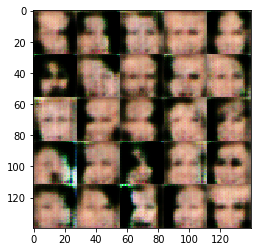

Epoch 1/3... Discriminator Loss: 1.5468... Generator Loss: 0.9281
Epoch 1/3... Discriminator Loss: 1.2578... Generator Loss: 1.1058


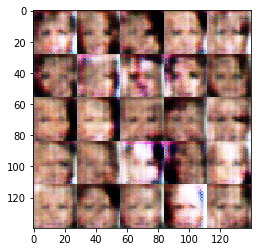

Epoch 1/3... Discriminator Loss: 1.5622... Generator Loss: 0.9543
Epoch 1/3... Discriminator Loss: 1.4101... Generator Loss: 0.9279


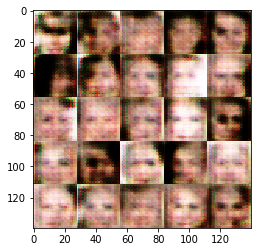

Epoch 1/3... Discriminator Loss: 1.3414... Generator Loss: 1.0988
Epoch 1/3... Discriminator Loss: 1.3689... Generator Loss: 0.8345


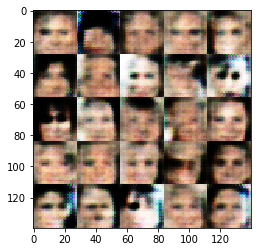

Epoch 1/3... Discriminator Loss: 1.2395... Generator Loss: 1.5691
Epoch 1/3... Discriminator Loss: 1.4898... Generator Loss: 1.1584


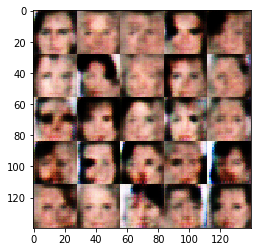

Epoch 1/3... Discriminator Loss: 1.0515... Generator Loss: 1.4617
Epoch 1/3... Discriminator Loss: 1.4784... Generator Loss: 0.6071


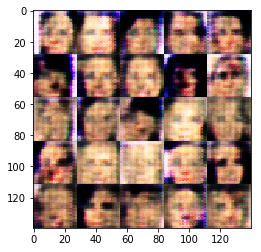

Epoch 1/3... Discriminator Loss: 0.9367... Generator Loss: 1.3426
Epoch 1/3... Discriminator Loss: 0.5934... Generator Loss: 1.8763


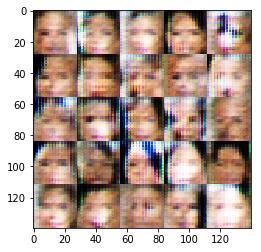

Epoch 1/3... Discriminator Loss: 1.3305... Generator Loss: 1.0025
Epoch 1/3... Discriminator Loss: 1.2698... Generator Loss: 0.9855


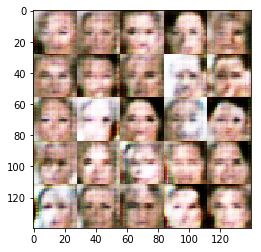

Epoch 1/3... Discriminator Loss: 1.2328... Generator Loss: 1.5956
Epoch 1/3... Discriminator Loss: 1.2723... Generator Loss: 1.9131


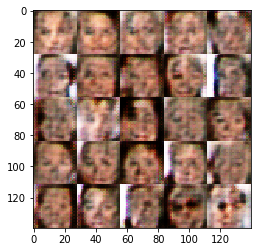

Epoch 1/3... Discriminator Loss: 1.4755... Generator Loss: 0.8799
Epoch 1/3... Discriminator Loss: 1.3925... Generator Loss: 0.8772


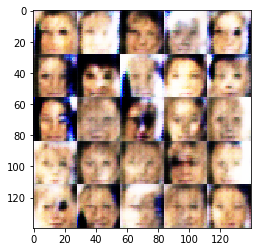

Epoch 1/3... Discriminator Loss: 1.4473... Generator Loss: 1.6945
Epoch 1/3... Discriminator Loss: 1.4713... Generator Loss: 0.9243


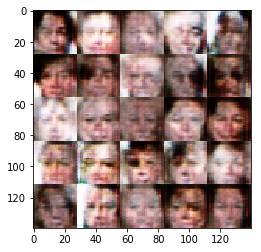

Epoch 1/3... Discriminator Loss: 1.3904... Generator Loss: 0.6435
Epoch 1/3... Discriminator Loss: 1.0343... Generator Loss: 1.0785


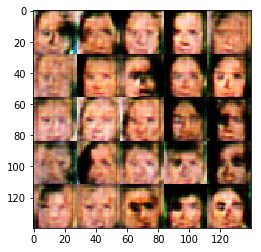

Epoch 1/3... Discriminator Loss: 1.4125... Generator Loss: 0.7795
Epoch 1/3... Discriminator Loss: 1.4034... Generator Loss: 1.0864


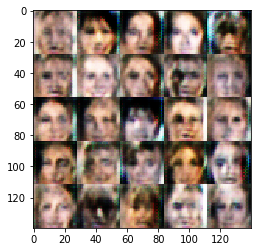

Epoch 1/3... Discriminator Loss: 1.1572... Generator Loss: 0.8062
Epoch 1/3... Discriminator Loss: 1.3924... Generator Loss: 0.9166


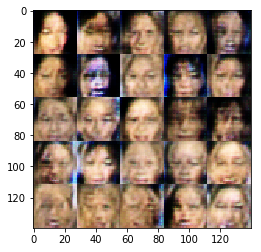

Epoch 1/3... Discriminator Loss: 1.2092... Generator Loss: 0.7820
Epoch 1/3... Discriminator Loss: 1.2970... Generator Loss: 0.9171


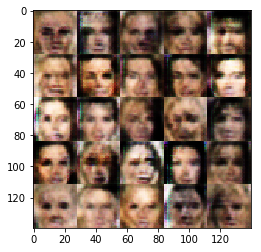

Epoch 1/3... Discriminator Loss: 1.2038... Generator Loss: 0.9540
Epoch 1/3... Discriminator Loss: 1.5824... Generator Loss: 0.5914


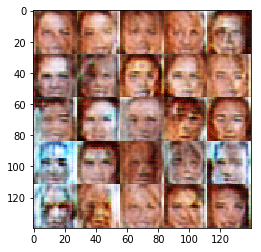

Epoch 1/3... Discriminator Loss: 1.2289... Generator Loss: 0.9984
Epoch 1/3... Discriminator Loss: 1.2458... Generator Loss: 0.7312


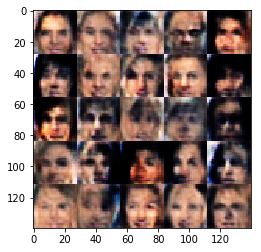

Epoch 1/3... Discriminator Loss: 1.2748... Generator Loss: 1.2173
Epoch 1/3... Discriminator Loss: 1.5692... Generator Loss: 1.1533


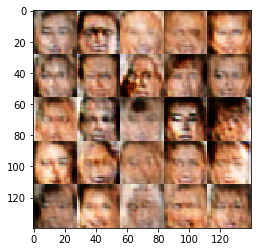

Epoch 1/3... Discriminator Loss: 1.3370... Generator Loss: 1.0514
Epoch 1/3... Discriminator Loss: 1.3362... Generator Loss: 1.1982


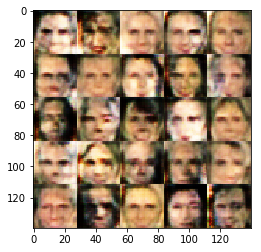

Epoch 1/3... Discriminator Loss: 1.3919... Generator Loss: 0.8359
Epoch 1/3... Discriminator Loss: 1.2468... Generator Loss: 0.9639


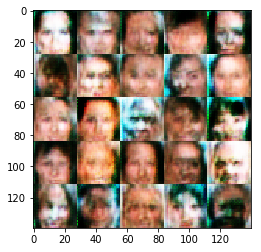

Epoch 1/3... Discriminator Loss: 1.4335... Generator Loss: 0.6360
Epoch 1/3... Discriminator Loss: 1.2204... Generator Loss: 0.9376


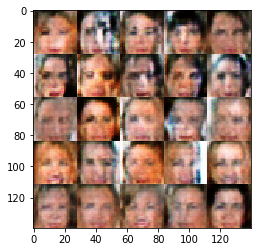

Epoch 1/3... Discriminator Loss: 1.1367... Generator Loss: 1.3125
Epoch 1/3... Discriminator Loss: 1.4220... Generator Loss: 0.7894


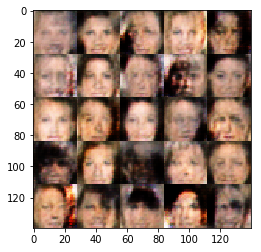

Epoch 1/3... Discriminator Loss: 1.5880... Generator Loss: 0.9194
Epoch 1/3... Discriminator Loss: 1.4013... Generator Loss: 1.0881


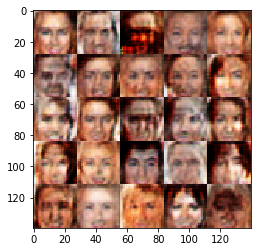

Epoch 1/3... Discriminator Loss: 1.5027... Generator Loss: 0.8740
Epoch 1/3... Discriminator Loss: 1.2471... Generator Loss: 0.7394


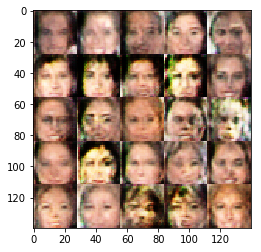

Epoch 1/3... Discriminator Loss: 1.4594... Generator Loss: 0.8306
Epoch 1/3... Discriminator Loss: 1.2559... Generator Loss: 0.8838


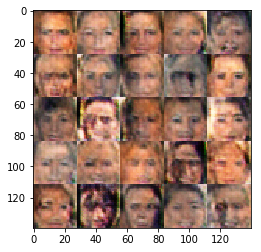

Epoch 1/3... Discriminator Loss: 1.1883... Generator Loss: 0.9351
Epoch 1/3... Discriminator Loss: 1.5772... Generator Loss: 0.7453


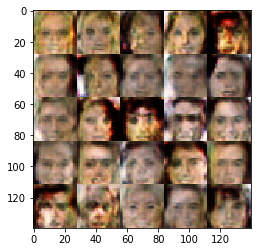

Epoch 1/3... Discriminator Loss: 1.4112... Generator Loss: 1.3294
Epoch 1/3... Discriminator Loss: 1.3538... Generator Loss: 0.9424


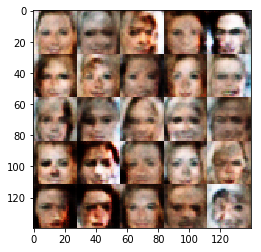

Epoch 1/3... Discriminator Loss: 1.3825... Generator Loss: 0.7786
Epoch 1/3... Discriminator Loss: 1.3296... Generator Loss: 0.9328


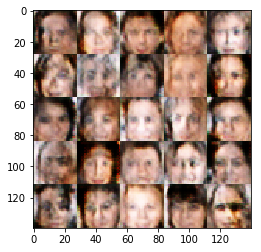

Epoch 1/3... Discriminator Loss: 1.3312... Generator Loss: 0.7686
Epoch 1/3... Discriminator Loss: 1.4786... Generator Loss: 1.0244


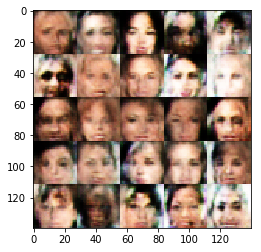

Epoch 1/3... Discriminator Loss: 1.4017... Generator Loss: 1.0384
Epoch 1/3... Discriminator Loss: 1.3449... Generator Loss: 1.0515


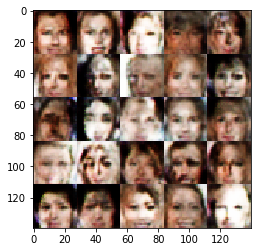

Epoch 1/3... Discriminator Loss: 1.4950... Generator Loss: 0.8908
Epoch 1/3... Discriminator Loss: 1.4074... Generator Loss: 0.9993


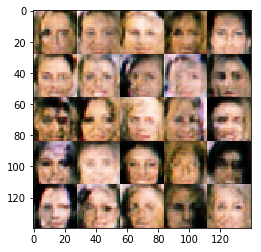

Epoch 1/3... Discriminator Loss: 1.4485... Generator Loss: 0.8173
Epoch 1/3... Discriminator Loss: 1.5082... Generator Loss: 0.7160


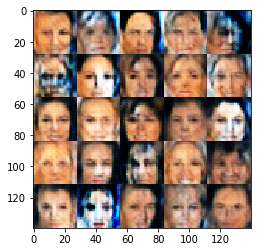

Epoch 1/3... Discriminator Loss: 1.2993... Generator Loss: 1.0291
Epoch 1/3... Discriminator Loss: 1.3741... Generator Loss: 0.8402


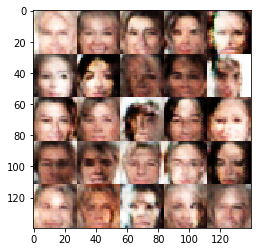

Epoch 1/3... Discriminator Loss: 1.5146... Generator Loss: 0.8320
Epoch 1/3... Discriminator Loss: 1.2707... Generator Loss: 0.9218


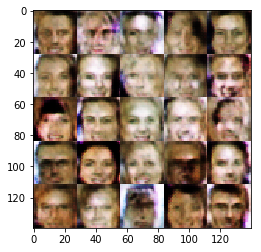

Epoch 1/3... Discriminator Loss: 1.3289... Generator Loss: 0.7896
Epoch 1/3... Discriminator Loss: 1.2740... Generator Loss: 0.9343


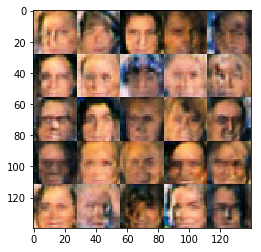

Epoch 1/3... Discriminator Loss: 1.3374... Generator Loss: 0.8670
Epoch 1/3... Discriminator Loss: 1.4572... Generator Loss: 0.8020


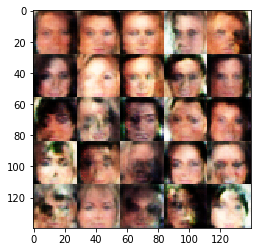

Epoch 1/3... Discriminator Loss: 1.3117... Generator Loss: 0.7739
Epoch 1/3... Discriminator Loss: 1.3564... Generator Loss: 0.7966


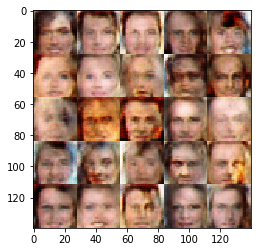

Epoch 1/3... Discriminator Loss: 1.4341... Generator Loss: 0.9230
Epoch 1/3... Discriminator Loss: 1.4098... Generator Loss: 0.8370


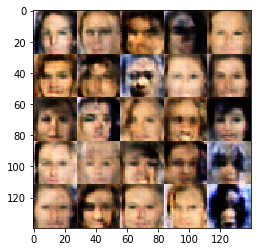

Epoch 1/3... Discriminator Loss: 1.4224... Generator Loss: 0.8650
Epoch 1/3... Discriminator Loss: 1.4602... Generator Loss: 0.9208


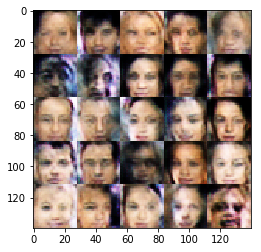

Epoch 1/3... Discriminator Loss: 1.3237... Generator Loss: 0.7078
Epoch 1/3... Discriminator Loss: 1.4886... Generator Loss: 1.1293


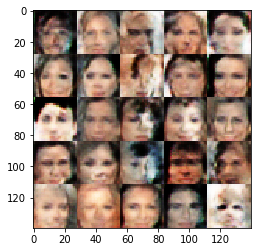

Epoch 1/3... Discriminator Loss: 1.2894... Generator Loss: 0.8205
Epoch 1/3... Discriminator Loss: 1.4551... Generator Loss: 0.8299


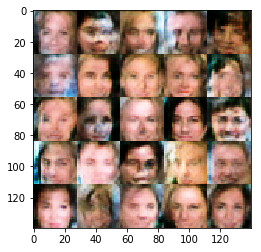

Epoch 1/3... Discriminator Loss: 1.3401... Generator Loss: 0.7916
Epoch 1/3... Discriminator Loss: 1.2654... Generator Loss: 0.8875


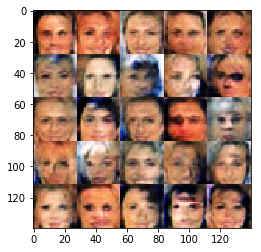

Epoch 1/3... Discriminator Loss: 1.2912... Generator Loss: 1.0151
Epoch 1/3... Discriminator Loss: 1.3817... Generator Loss: 0.8034


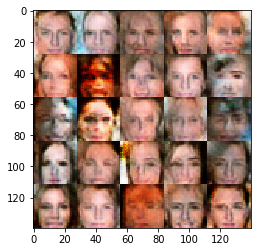

Epoch 1/3... Discriminator Loss: 1.3465... Generator Loss: 0.8429
Epoch 1/3... Discriminator Loss: 1.3357... Generator Loss: 0.8061


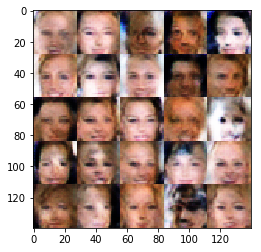

Epoch 1/3... Discriminator Loss: 1.3538... Generator Loss: 0.7799
Epoch 1/3... Discriminator Loss: 1.5198... Generator Loss: 0.6899


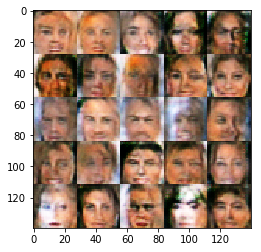

Epoch 1/3... Discriminator Loss: 1.4095... Generator Loss: 0.7502
Epoch 1/3... Discriminator Loss: 1.4395... Generator Loss: 1.0045


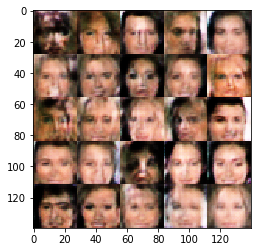

Epoch 1/3... Discriminator Loss: 1.3787... Generator Loss: 0.8447
Epoch 1/3... Discriminator Loss: 1.4365... Generator Loss: 0.8400


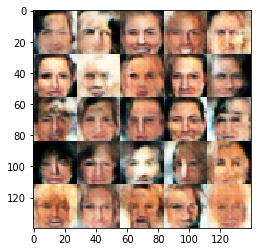

Epoch 1/3... Discriminator Loss: 1.4460... Generator Loss: 0.8787
Epoch 1/3... Discriminator Loss: 1.3992... Generator Loss: 0.8207


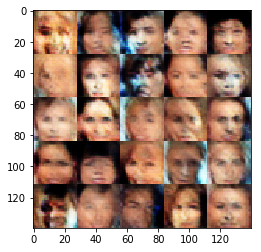

Epoch 1/3... Discriminator Loss: 1.2832... Generator Loss: 0.9604
Epoch 1/3... Discriminator Loss: 1.4359... Generator Loss: 0.9168


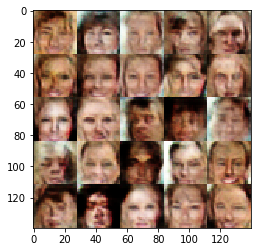

Epoch 1/3... Discriminator Loss: 1.5334... Generator Loss: 0.7086
Epoch 1/3... Discriminator Loss: 1.2806... Generator Loss: 0.7852


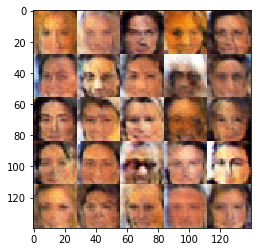

Epoch 1/3... Discriminator Loss: 1.2698... Generator Loss: 0.8031
Epoch 1/3... Discriminator Loss: 1.3749... Generator Loss: 0.8186


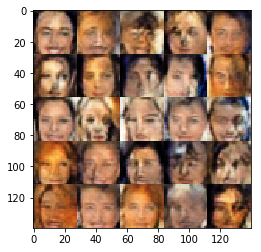

Epoch 1/3... Discriminator Loss: 1.4262... Generator Loss: 1.0095
Epoch 1/3... Discriminator Loss: 1.3794... Generator Loss: 0.9173


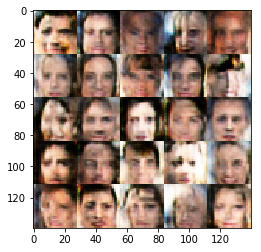

Epoch 1/3... Discriminator Loss: 1.2357... Generator Loss: 0.8950
Epoch 1/3... Discriminator Loss: 1.4529... Generator Loss: 0.8298


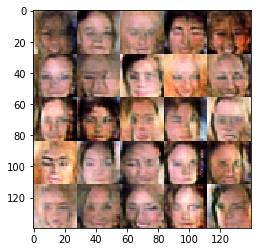

Epoch 1/3... Discriminator Loss: 1.3939... Generator Loss: 0.9041
Epoch 1/3... Discriminator Loss: 1.3061... Generator Loss: 0.8813


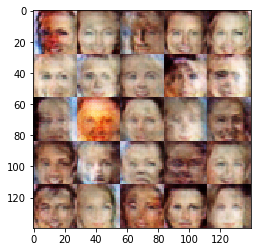

Epoch 1/3... Discriminator Loss: 1.4798... Generator Loss: 0.7353
Epoch 1/3... Discriminator Loss: 1.4275... Generator Loss: 0.9915


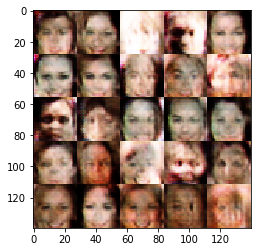

Epoch 1/3... Discriminator Loss: 1.4352... Generator Loss: 0.7797
Epoch 1/3... Discriminator Loss: 1.3798... Generator Loss: 0.8733


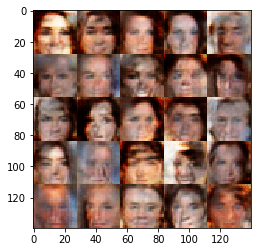

Epoch 1/3... Discriminator Loss: 1.5781... Generator Loss: 0.6176
Epoch 1/3... Discriminator Loss: 1.4024... Generator Loss: 0.9404


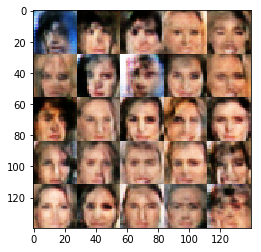

Epoch 1/3... Discriminator Loss: 1.2741... Generator Loss: 0.7223
Epoch 1/3... Discriminator Loss: 1.4225... Generator Loss: 0.9594


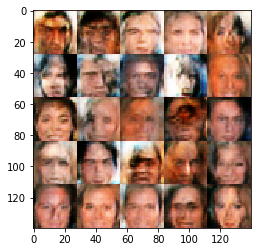

Epoch 1/3... Discriminator Loss: 1.4561... Generator Loss: 0.8011
Epoch 1/3... Discriminator Loss: 1.4959... Generator Loss: 0.6996


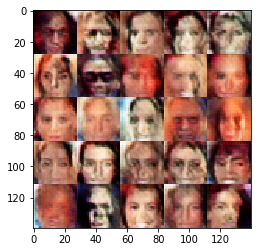

Epoch 1/3... Discriminator Loss: 1.4513... Generator Loss: 0.9282
Epoch 1/3... Discriminator Loss: 1.4120... Generator Loss: 0.6702


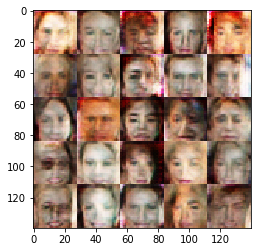

Epoch 1/3... Discriminator Loss: 1.7304... Generator Loss: 0.6148
Epoch 1/3... Discriminator Loss: 1.4550... Generator Loss: 0.7527


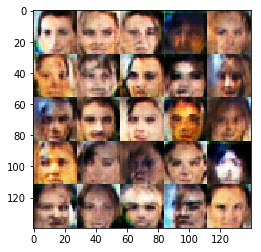

Epoch 2/3... Discriminator Loss: 1.4967... Generator Loss: 0.8565
Epoch 2/3... Discriminator Loss: 1.3953... Generator Loss: 0.8462


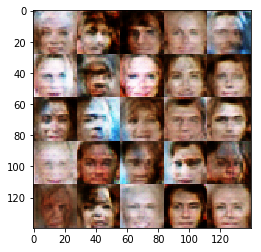

Epoch 2/3... Discriminator Loss: 1.2842... Generator Loss: 0.9024
Epoch 2/3... Discriminator Loss: 1.4039... Generator Loss: 0.8216


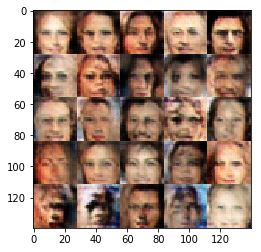

Epoch 2/3... Discriminator Loss: 1.5540... Generator Loss: 0.6045
Epoch 2/3... Discriminator Loss: 1.2079... Generator Loss: 0.7843


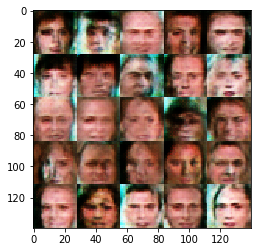

Epoch 2/3... Discriminator Loss: 1.2930... Generator Loss: 0.7784
Epoch 2/3... Discriminator Loss: 1.2918... Generator Loss: 0.8552
Epoch 2/3... Discriminator Loss: 1.3750... Generator Loss: 0.7824


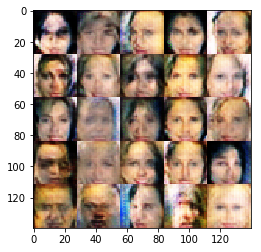

Epoch 2/3... Discriminator Loss: 1.3223... Generator Loss: 0.8896
Epoch 2/3... Discriminator Loss: 1.4200... Generator Loss: 0.7837


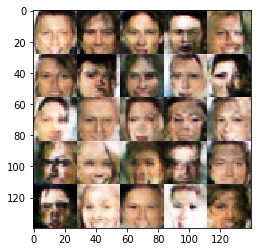

Epoch 2/3... Discriminator Loss: 1.4137... Generator Loss: 0.8257
Epoch 2/3... Discriminator Loss: 1.4369... Generator Loss: 0.6957


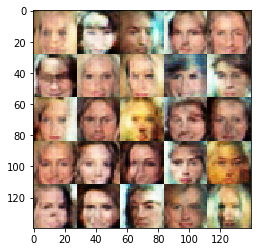

Epoch 2/3... Discriminator Loss: 1.3673... Generator Loss: 0.7432
Epoch 2/3... Discriminator Loss: 1.3747... Generator Loss: 0.8166


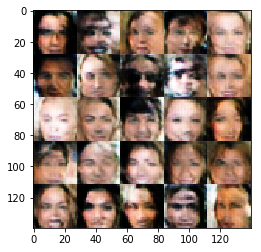

Epoch 2/3... Discriminator Loss: 1.5410... Generator Loss: 0.7683
Epoch 2/3... Discriminator Loss: 1.3609... Generator Loss: 0.9937


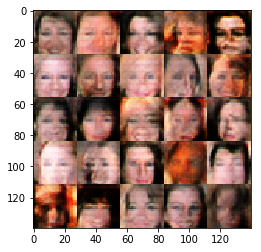

Epoch 2/3... Discriminator Loss: 1.3753... Generator Loss: 0.8354
Epoch 2/3... Discriminator Loss: 1.4221... Generator Loss: 0.8060


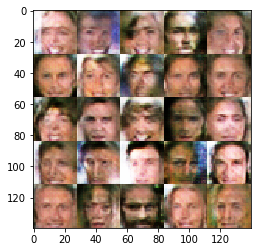

Epoch 2/3... Discriminator Loss: 1.2977... Generator Loss: 0.8468
Epoch 2/3... Discriminator Loss: 1.2973... Generator Loss: 0.7684


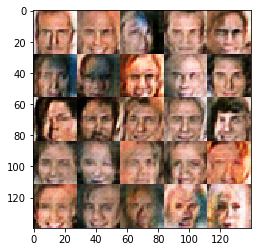

Epoch 2/3... Discriminator Loss: 1.4140... Generator Loss: 0.6823
Epoch 2/3... Discriminator Loss: 1.4398... Generator Loss: 0.7596


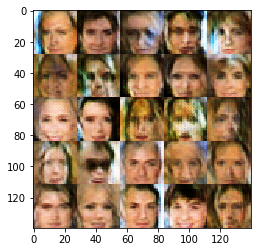

Epoch 2/3... Discriminator Loss: 1.4410... Generator Loss: 0.9105
Epoch 2/3... Discriminator Loss: 1.3897... Generator Loss: 0.8623


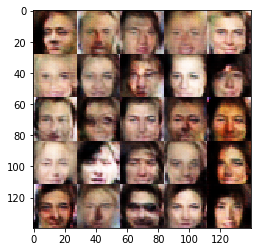

Epoch 2/3... Discriminator Loss: 1.4362... Generator Loss: 0.9164
Epoch 2/3... Discriminator Loss: 1.4152... Generator Loss: 0.7893


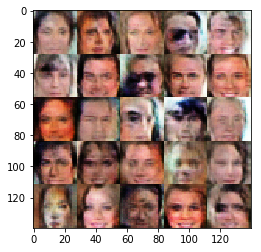

Epoch 2/3... Discriminator Loss: 1.3629... Generator Loss: 0.8134
Epoch 2/3... Discriminator Loss: 1.3964... Generator Loss: 0.7709


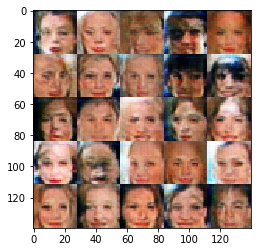

Epoch 2/3... Discriminator Loss: 1.3278... Generator Loss: 0.8900
Epoch 2/3... Discriminator Loss: 1.2777... Generator Loss: 0.9391


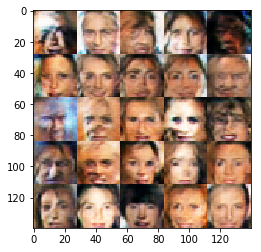

Epoch 2/3... Discriminator Loss: 1.2893... Generator Loss: 0.8483
Epoch 2/3... Discriminator Loss: 1.3893... Generator Loss: 0.7578
Epoch 2/3... Discriminator Loss: 1.3668... Generator Loss: 0.8494
Epoch 2/3... Discriminator Loss: 1.3627... Generator Loss: 1.0355


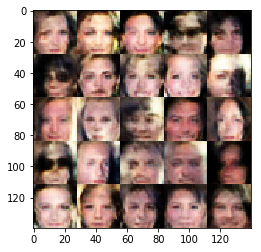

Epoch 2/3... Discriminator Loss: 1.3734... Generator Loss: 0.8825
Epoch 2/3... Discriminator Loss: 1.3782... Generator Loss: 0.7889


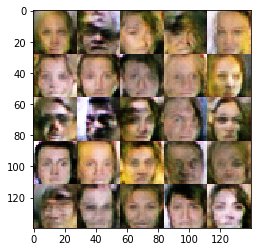

Epoch 2/3... Discriminator Loss: 1.3258... Generator Loss: 0.8091
Epoch 2/3... Discriminator Loss: 1.2856... Generator Loss: 1.0272


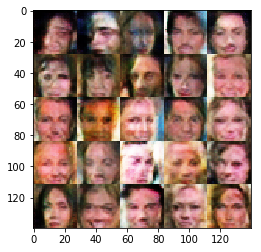

Epoch 2/3... Discriminator Loss: 1.4677... Generator Loss: 0.7111
Epoch 2/3... Discriminator Loss: 1.4125... Generator Loss: 0.7942


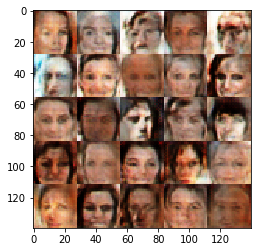

Epoch 2/3... Discriminator Loss: 1.4369... Generator Loss: 0.7470
Epoch 2/3... Discriminator Loss: 1.4522... Generator Loss: 0.7753


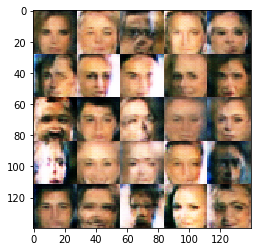

Epoch 2/3... Discriminator Loss: 1.3907... Generator Loss: 0.8817
Epoch 2/3... Discriminator Loss: 1.2922... Generator Loss: 0.7609


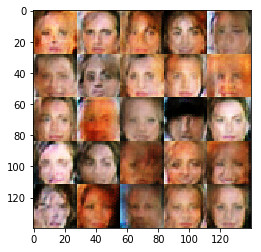

Epoch 2/3... Discriminator Loss: 1.2998... Generator Loss: 0.9467
Epoch 2/3... Discriminator Loss: 1.3865... Generator Loss: 0.8524


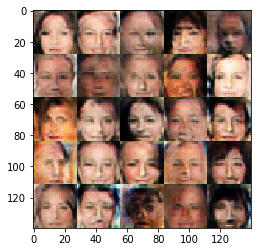

Epoch 2/3... Discriminator Loss: 1.4098... Generator Loss: 0.7921
Epoch 2/3... Discriminator Loss: 1.3258... Generator Loss: 0.6981


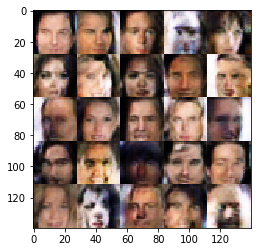

Epoch 2/3... Discriminator Loss: 1.3927... Generator Loss: 0.8310
Epoch 2/3... Discriminator Loss: 1.4085... Generator Loss: 0.8195


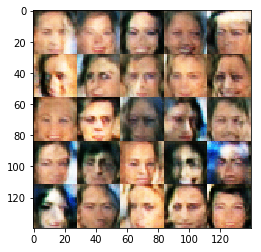

Epoch 2/3... Discriminator Loss: 1.3278... Generator Loss: 0.8386
Epoch 2/3... Discriminator Loss: 1.4287... Generator Loss: 0.8589


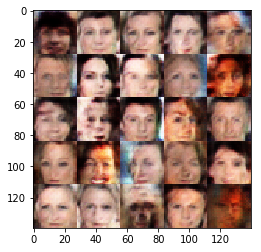

Epoch 2/3... Discriminator Loss: 1.3462... Generator Loss: 0.7776
Epoch 2/3... Discriminator Loss: 1.2947... Generator Loss: 1.0075


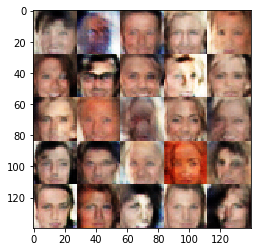

Epoch 2/3... Discriminator Loss: 1.2217... Generator Loss: 0.8630
Epoch 2/3... Discriminator Loss: 1.2266... Generator Loss: 0.7975


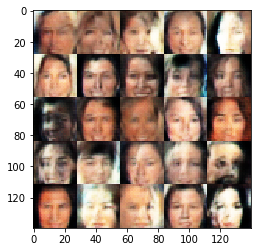

Epoch 2/3... Discriminator Loss: 1.2939... Generator Loss: 0.8558
Epoch 2/3... Discriminator Loss: 1.5081... Generator Loss: 0.8895


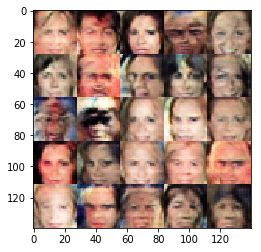

Epoch 2/3... Discriminator Loss: 1.4057... Generator Loss: 1.0769
Epoch 2/3... Discriminator Loss: 1.2797... Generator Loss: 0.9509


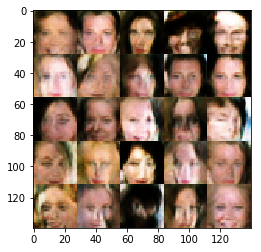

Epoch 2/3... Discriminator Loss: 1.3505... Generator Loss: 0.6552
Epoch 2/3... Discriminator Loss: 1.4068... Generator Loss: 0.8411


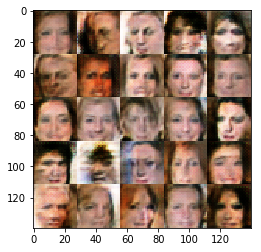

Epoch 2/3... Discriminator Loss: 1.4682... Generator Loss: 0.8231
Epoch 2/3... Discriminator Loss: 1.3705... Generator Loss: 0.7334


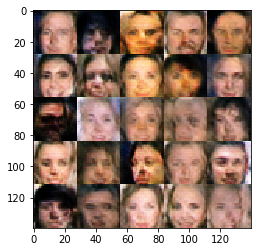

Epoch 2/3... Discriminator Loss: 1.3245... Generator Loss: 0.8719
Epoch 2/3... Discriminator Loss: 1.3872... Generator Loss: 0.8244


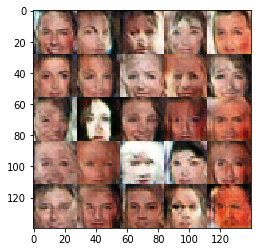

Epoch 2/3... Discriminator Loss: 1.4402... Generator Loss: 0.8443
Epoch 2/3... Discriminator Loss: 1.3840... Generator Loss: 0.8277


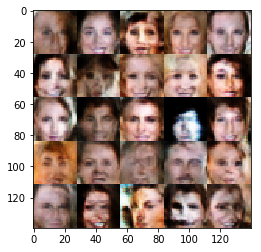

Epoch 2/3... Discriminator Loss: 1.4720... Generator Loss: 0.8123
Epoch 2/3... Discriminator Loss: 1.4300... Generator Loss: 0.8693


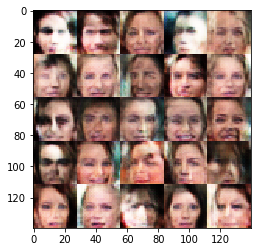

Epoch 2/3... Discriminator Loss: 1.3098... Generator Loss: 0.8097
Epoch 2/3... Discriminator Loss: 1.4095... Generator Loss: 0.9135


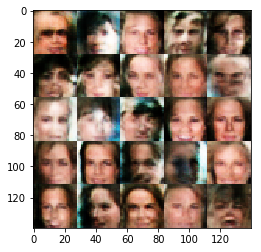

Epoch 2/3... Discriminator Loss: 1.3737... Generator Loss: 0.6990
Epoch 2/3... Discriminator Loss: 1.3391... Generator Loss: 0.7868


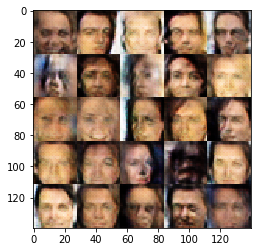

Epoch 2/3... Discriminator Loss: 1.3881... Generator Loss: 0.9000
Epoch 2/3... Discriminator Loss: 1.3629... Generator Loss: 0.7605


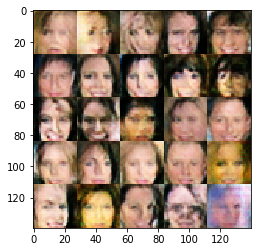

Epoch 2/3... Discriminator Loss: 1.3718... Generator Loss: 1.0083
Epoch 2/3... Discriminator Loss: 1.3850... Generator Loss: 0.9141


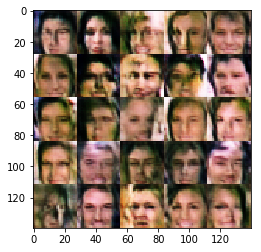

Epoch 2/3... Discriminator Loss: 1.3378... Generator Loss: 0.8952
Epoch 2/3... Discriminator Loss: 1.3380... Generator Loss: 0.9132


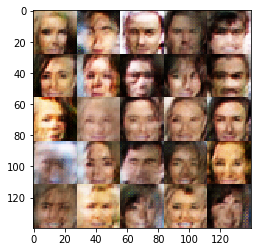

Epoch 2/3... Discriminator Loss: 1.3002... Generator Loss: 0.9593
Epoch 2/3... Discriminator Loss: 1.4013... Generator Loss: 0.8217


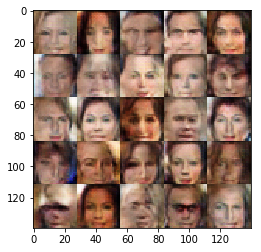

Epoch 2/3... Discriminator Loss: 1.3227... Generator Loss: 0.8071
Epoch 2/3... Discriminator Loss: 1.3327... Generator Loss: 0.8766


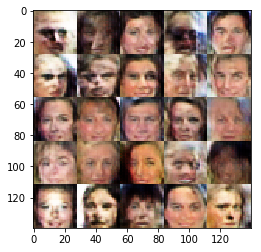

Epoch 2/3... Discriminator Loss: 1.4789... Generator Loss: 0.7676
Epoch 2/3... Discriminator Loss: 1.3530... Generator Loss: 0.8422


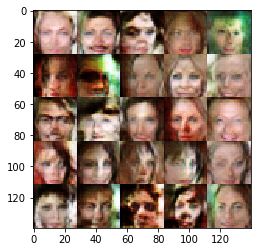

Epoch 2/3... Discriminator Loss: 1.2996... Generator Loss: 0.7166
Epoch 2/3... Discriminator Loss: 1.3543... Generator Loss: 0.8727


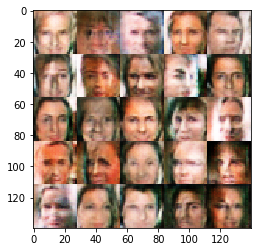

Epoch 2/3... Discriminator Loss: 1.3941... Generator Loss: 0.8019
Epoch 2/3... Discriminator Loss: 1.4262... Generator Loss: 0.7075


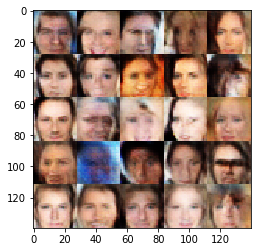

Epoch 2/3... Discriminator Loss: 1.4662... Generator Loss: 0.6636
Epoch 2/3... Discriminator Loss: 1.4545... Generator Loss: 0.7318


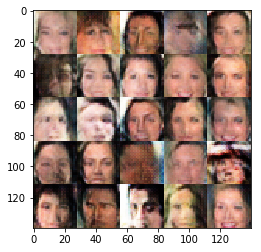

Epoch 2/3... Discriminator Loss: 1.2592... Generator Loss: 0.9179
Epoch 2/3... Discriminator Loss: 1.3585... Generator Loss: 0.9240


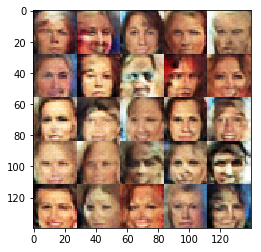

Epoch 2/3... Discriminator Loss: 1.3659... Generator Loss: 0.8001
Epoch 2/3... Discriminator Loss: 1.3630... Generator Loss: 0.8875


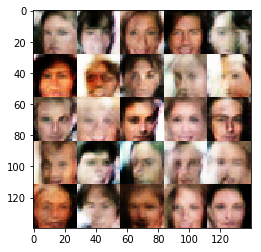

Epoch 2/3... Discriminator Loss: 1.4173... Generator Loss: 0.8932
Epoch 2/3... Discriminator Loss: 1.3052... Generator Loss: 0.8064


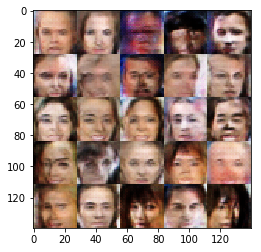

Epoch 2/3... Discriminator Loss: 1.3322... Generator Loss: 0.8826
Epoch 2/3... Discriminator Loss: 1.2551... Generator Loss: 0.6781


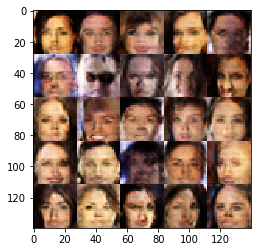

Epoch 2/3... Discriminator Loss: 1.3298... Generator Loss: 0.7994
Epoch 2/3... Discriminator Loss: 1.2948... Generator Loss: 0.9449


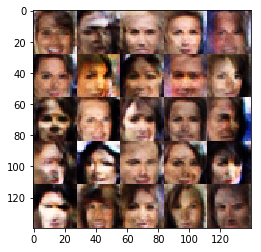

Epoch 2/3... Discriminator Loss: 1.3094... Generator Loss: 0.8682
Epoch 2/3... Discriminator Loss: 1.3449... Generator Loss: 0.8918


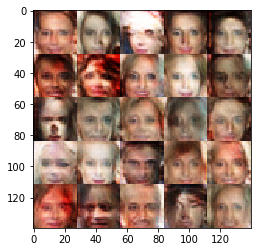

Epoch 2/3... Discriminator Loss: 1.4040... Generator Loss: 0.7384
Epoch 2/3... Discriminator Loss: 1.3422... Generator Loss: 0.9437


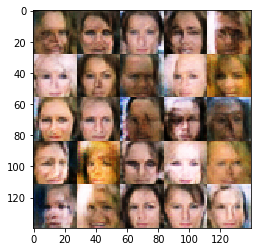

Epoch 2/3... Discriminator Loss: 1.3420... Generator Loss: 0.8665
Epoch 2/3... Discriminator Loss: 1.3820... Generator Loss: 0.9500


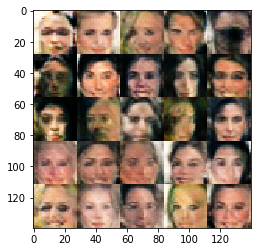

Epoch 2/3... Discriminator Loss: 1.3930... Generator Loss: 0.8866
Epoch 2/3... Discriminator Loss: 1.3603... Generator Loss: 0.7935


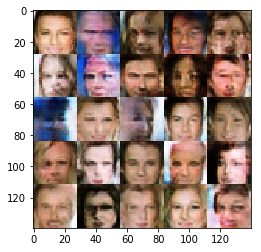

Epoch 2/3... Discriminator Loss: 1.2891... Generator Loss: 0.7953
Epoch 2/3... Discriminator Loss: 1.4616... Generator Loss: 0.8602


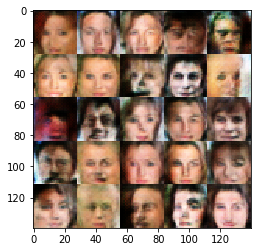

Epoch 2/3... Discriminator Loss: 1.4113... Generator Loss: 0.9771
Epoch 2/3... Discriminator Loss: 1.3018... Generator Loss: 0.8303


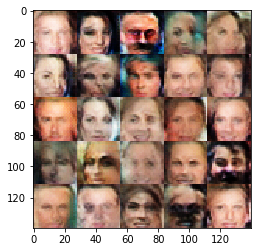

Epoch 2/3... Discriminator Loss: 1.4175... Generator Loss: 0.8198
Epoch 2/3... Discriminator Loss: 1.3671... Generator Loss: 0.7592


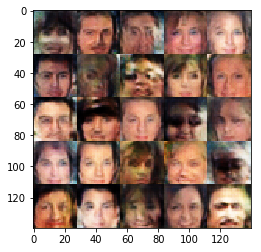

Epoch 2/3... Discriminator Loss: 1.2910... Generator Loss: 0.8719
Epoch 3/3... Discriminator Loss: 1.4273... Generator Loss: 0.7288


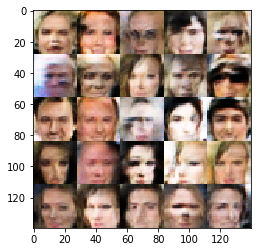

Epoch 3/3... Discriminator Loss: 1.3682... Generator Loss: 0.7381
Epoch 3/3... Discriminator Loss: 1.5088... Generator Loss: 0.7905


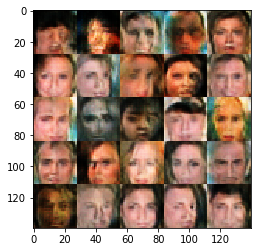

Epoch 3/3... Discriminator Loss: 1.3005... Generator Loss: 0.8942
Epoch 3/3... Discriminator Loss: 1.2982... Generator Loss: 0.7992


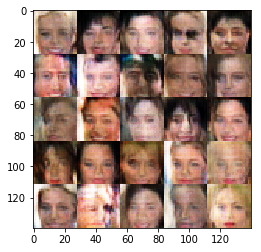

Epoch 3/3... Discriminator Loss: 1.3789... Generator Loss: 0.9117
Epoch 3/3... Discriminator Loss: 1.3559... Generator Loss: 0.7530


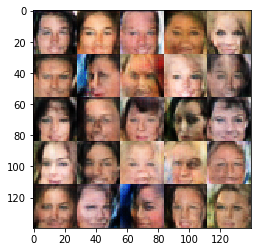

Epoch 3/3... Discriminator Loss: 1.3300... Generator Loss: 0.7100
Epoch 3/3... Discriminator Loss: 1.3404... Generator Loss: 0.8688


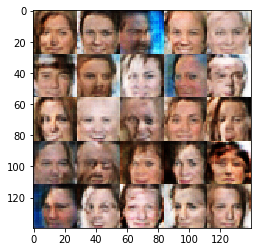

Epoch 3/3... Discriminator Loss: 1.3616... Generator Loss: 0.8211
Epoch 3/3... Discriminator Loss: 1.4065... Generator Loss: 0.6816


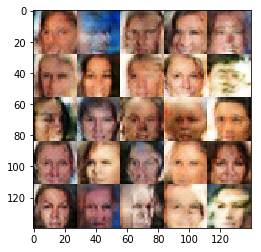

Epoch 3/3... Discriminator Loss: 1.2737... Generator Loss: 0.8216
Epoch 3/3... Discriminator Loss: 1.4163... Generator Loss: 0.8291


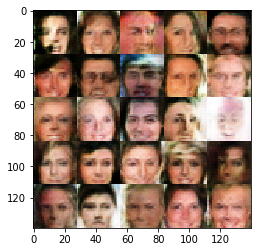

Epoch 3/3... Discriminator Loss: 1.4305... Generator Loss: 1.0050
Epoch 3/3... Discriminator Loss: 1.5833... Generator Loss: 0.7175


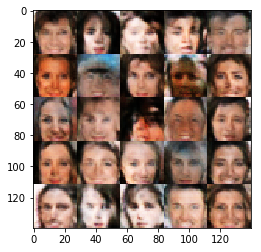

Epoch 3/3... Discriminator Loss: 1.3502... Generator Loss: 1.0990
Epoch 3/3... Discriminator Loss: 1.3425... Generator Loss: 0.7563


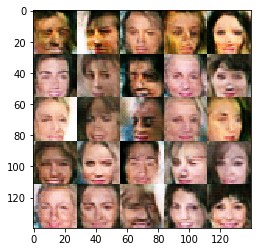

Epoch 3/3... Discriminator Loss: 1.3757... Generator Loss: 0.8359
Epoch 3/3... Discriminator Loss: 1.4226... Generator Loss: 0.7703


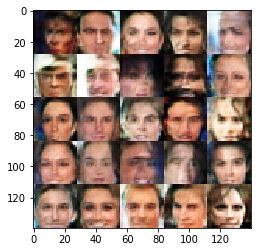

Epoch 3/3... Discriminator Loss: 1.3674... Generator Loss: 0.8153
Epoch 3/3... Discriminator Loss: 1.2714... Generator Loss: 0.9869


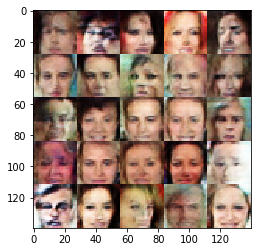

Epoch 3/3... Discriminator Loss: 1.4160... Generator Loss: 0.8109
Epoch 3/3... Discriminator Loss: 1.4303... Generator Loss: 0.7853


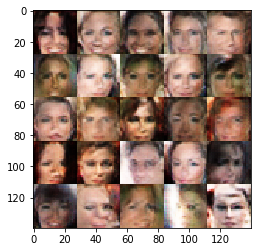

Epoch 3/3... Discriminator Loss: 1.3514... Generator Loss: 0.8084
Epoch 3/3... Discriminator Loss: 1.5036... Generator Loss: 0.8889


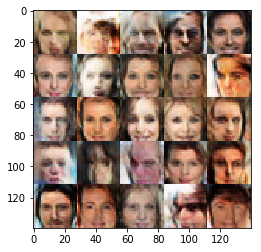

Epoch 3/3... Discriminator Loss: 1.3129... Generator Loss: 0.8141
Epoch 3/3... Discriminator Loss: 1.4529... Generator Loss: 0.6769


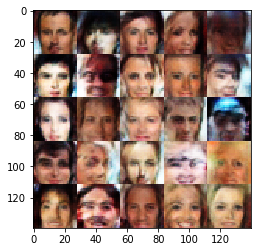

Epoch 3/3... Discriminator Loss: 1.3148... Generator Loss: 0.8334
Epoch 3/3... Discriminator Loss: 1.3876... Generator Loss: 0.6929


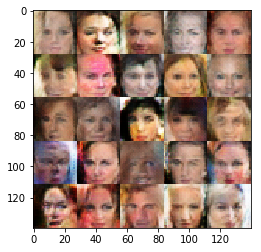

Epoch 3/3... Discriminator Loss: 1.3245... Generator Loss: 0.7222
Epoch 3/3... Discriminator Loss: 1.4222... Generator Loss: 0.8748


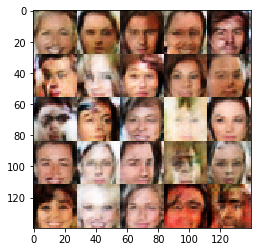

Epoch 3/3... Discriminator Loss: 1.3619... Generator Loss: 0.8279
Epoch 3/3... Discriminator Loss: 1.3735... Generator Loss: 0.7768


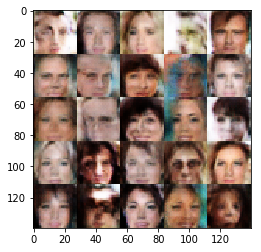

Epoch 3/3... Discriminator Loss: 1.3844... Generator Loss: 0.9468
Epoch 3/3... Discriminator Loss: 1.3427... Generator Loss: 0.8127


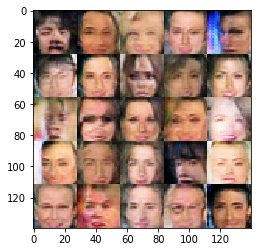

Epoch 3/3... Discriminator Loss: 1.2698... Generator Loss: 0.8403
Epoch 3/3... Discriminator Loss: 1.3897... Generator Loss: 0.7265


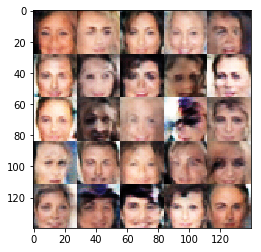

Epoch 3/3... Discriminator Loss: 1.2529... Generator Loss: 0.9523
Epoch 3/3... Discriminator Loss: 1.3260... Generator Loss: 0.8069


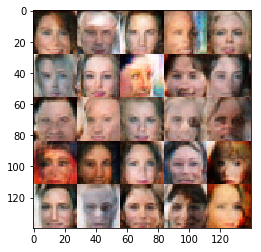

Epoch 3/3... Discriminator Loss: 1.3109... Generator Loss: 0.8346
Epoch 3/3... Discriminator Loss: 1.3630... Generator Loss: 0.8997


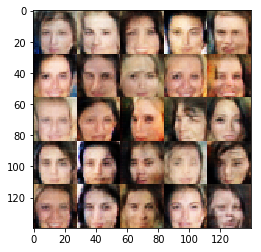

Epoch 3/3... Discriminator Loss: 1.3140... Generator Loss: 0.9011
Epoch 3/3... Discriminator Loss: 1.3841... Generator Loss: 0.8668


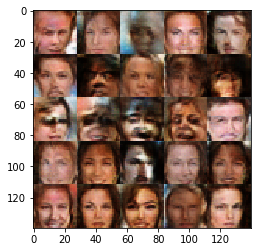

Epoch 3/3... Discriminator Loss: 1.2740... Generator Loss: 0.8287
Epoch 3/3... Discriminator Loss: 1.3433... Generator Loss: 0.9121


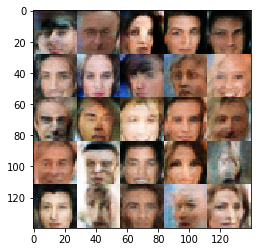

Epoch 3/3... Discriminator Loss: 1.1631... Generator Loss: 0.7973
Epoch 3/3... Discriminator Loss: 1.3174... Generator Loss: 0.7792


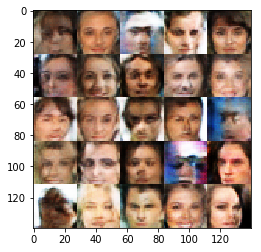

Epoch 3/3... Discriminator Loss: 1.3362... Generator Loss: 0.7865
Epoch 3/3... Discriminator Loss: 1.4406... Generator Loss: 0.8896


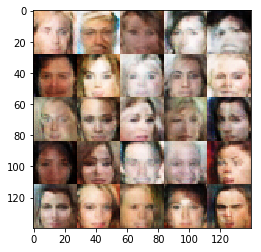

Epoch 3/3... Discriminator Loss: 1.4102... Generator Loss: 0.7630
Epoch 3/3... Discriminator Loss: 1.2638... Generator Loss: 0.7992


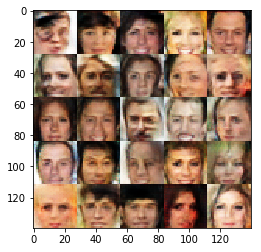

Epoch 3/3... Discriminator Loss: 1.3248... Generator Loss: 0.8999
Epoch 3/3... Discriminator Loss: 1.3152... Generator Loss: 0.7271


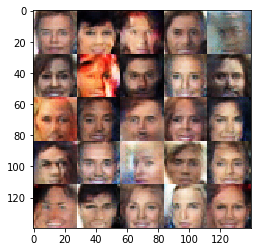

Epoch 3/3... Discriminator Loss: 1.3704... Generator Loss: 0.8763
Epoch 3/3... Discriminator Loss: 1.4144... Generator Loss: 0.7631


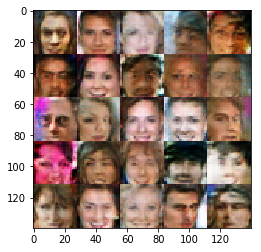

Epoch 3/3... Discriminator Loss: 1.3394... Generator Loss: 0.8442
Epoch 3/3... Discriminator Loss: 1.3140... Generator Loss: 0.7997


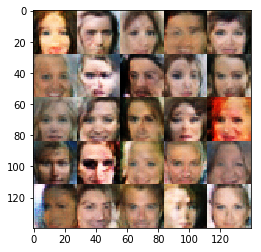

Epoch 3/3... Discriminator Loss: 1.2522... Generator Loss: 0.8354
Epoch 3/3... Discriminator Loss: 1.3523... Generator Loss: 0.7751


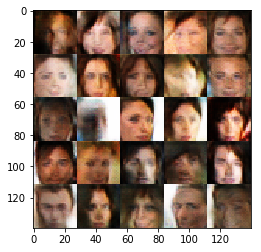

Epoch 3/3... Discriminator Loss: 1.3180... Generator Loss: 0.8777
Epoch 3/3... Discriminator Loss: 1.3965... Generator Loss: 0.8798


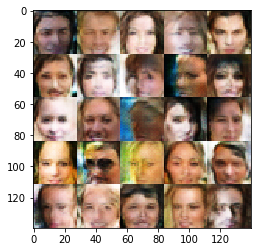

Epoch 3/3... Discriminator Loss: 1.2623... Generator Loss: 0.8250
Epoch 3/3... Discriminator Loss: 1.4434... Generator Loss: 0.7560


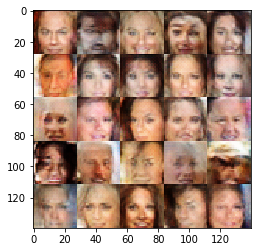

Epoch 3/3... Discriminator Loss: 1.4038... Generator Loss: 0.9672
Epoch 3/3... Discriminator Loss: 1.3230... Generator Loss: 0.8375


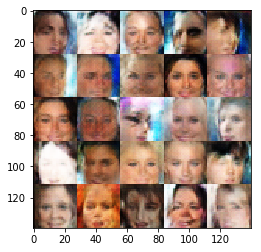

Epoch 3/3... Discriminator Loss: 1.2918... Generator Loss: 0.8962
Epoch 3/3... Discriminator Loss: 1.4401... Generator Loss: 0.8544


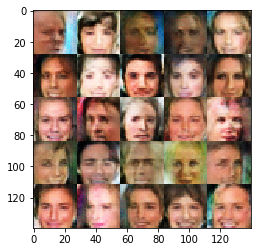

Epoch 3/3... Discriminator Loss: 1.3590... Generator Loss: 0.9538
Epoch 3/3... Discriminator Loss: 1.3420... Generator Loss: 0.9574


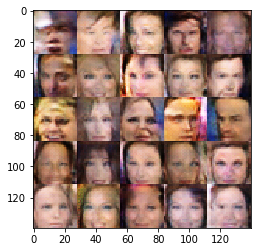

Epoch 3/3... Discriminator Loss: 1.3485... Generator Loss: 0.7934
Epoch 3/3... Discriminator Loss: 1.5005... Generator Loss: 0.8163


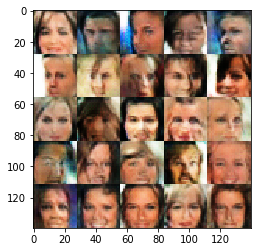

Epoch 3/3... Discriminator Loss: 1.4202... Generator Loss: 0.8299
Epoch 3/3... Discriminator Loss: 1.4206... Generator Loss: 0.7634


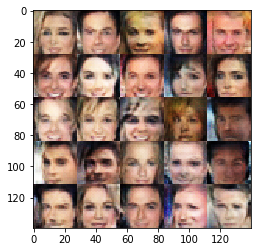

Epoch 3/3... Discriminator Loss: 1.3143... Generator Loss: 0.8188
Epoch 3/3... Discriminator Loss: 1.4208... Generator Loss: 0.7065


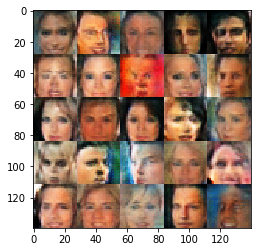

Epoch 3/3... Discriminator Loss: 1.2490... Generator Loss: 0.8101
Epoch 3/3... Discriminator Loss: 1.3167... Generator Loss: 0.7381


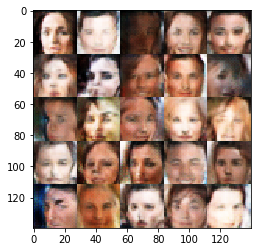

Epoch 3/3... Discriminator Loss: 1.3794... Generator Loss: 0.8697
Epoch 3/3... Discriminator Loss: 1.3329... Generator Loss: 0.8192


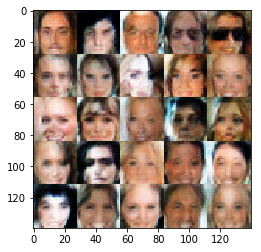

Epoch 3/3... Discriminator Loss: 1.3273... Generator Loss: 0.7413
Epoch 3/3... Discriminator Loss: 1.2822... Generator Loss: 0.9659


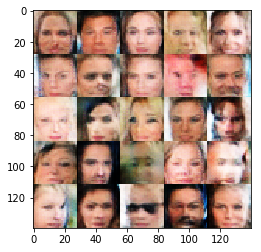

Epoch 3/3... Discriminator Loss: 1.3519... Generator Loss: 0.8614
Epoch 3/3... Discriminator Loss: 1.3787... Generator Loss: 0.6923


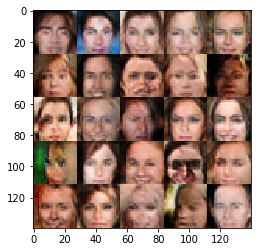

Epoch 3/3... Discriminator Loss: 1.3947... Generator Loss: 0.8123
Epoch 3/3... Discriminator Loss: 1.4397... Generator Loss: 0.7950


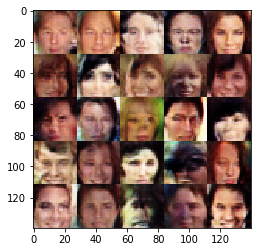

Epoch 3/3... Discriminator Loss: 1.3374... Generator Loss: 0.7546
Epoch 3/3... Discriminator Loss: 1.2760... Generator Loss: 0.8671


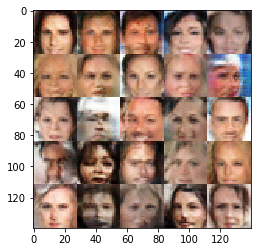

Epoch 3/3... Discriminator Loss: 1.3952... Generator Loss: 0.8016
Epoch 3/3... Discriminator Loss: 1.4234... Generator Loss: 0.8585


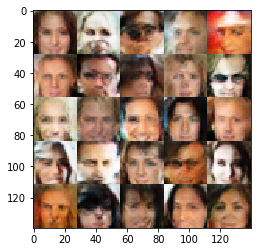

Epoch 3/3... Discriminator Loss: 1.3762... Generator Loss: 0.7921
Epoch 3/3... Discriminator Loss: 1.3881... Generator Loss: 0.9431


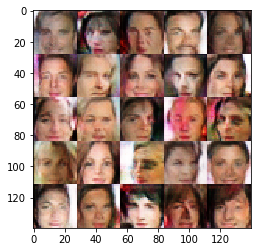

Epoch 3/3... Discriminator Loss: 1.3820... Generator Loss: 0.8721
Epoch 3/3... Discriminator Loss: 1.3116... Generator Loss: 1.0606


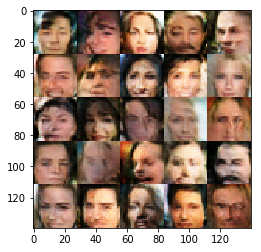

Epoch 3/3... Discriminator Loss: 1.4418... Generator Loss: 0.8200
Epoch 3/3... Discriminator Loss: 1.4498... Generator Loss: 0.9283


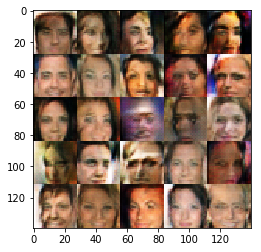

Epoch 3/3... Discriminator Loss: 1.3037... Generator Loss: 0.8622
Epoch 3/3... Discriminator Loss: 1.4478... Generator Loss: 0.8001


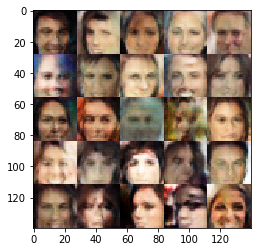

Epoch 3/3... Discriminator Loss: 1.3786... Generator Loss: 0.9345
Epoch 3/3... Discriminator Loss: 1.4041... Generator Loss: 0.9112


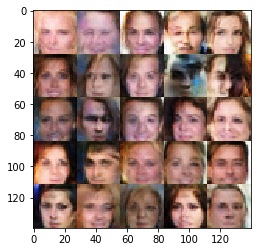

Epoch 3/3... Discriminator Loss: 1.2917... Generator Loss: 0.8610
Epoch 3/3... Discriminator Loss: 1.3871... Generator Loss: 0.9041


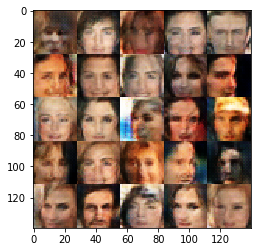

Epoch 3/3... Discriminator Loss: 1.4289... Generator Loss: 0.7591
Epoch 3/3... Discriminator Loss: 1.2949... Generator Loss: 0.9192


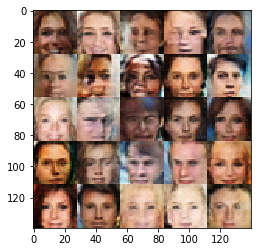

Epoch 3/3... Discriminator Loss: 1.4054... Generator Loss: 0.8231
Epoch 3/3... Discriminator Loss: 1.3601... Generator Loss: 0.7571


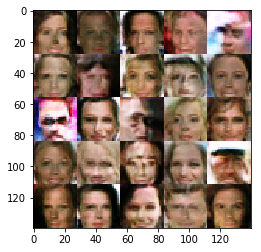

Epoch 3/3... Discriminator Loss: 1.3923... Generator Loss: 0.8445
Epoch 3/3... Discriminator Loss: 1.3405... Generator Loss: 0.8584


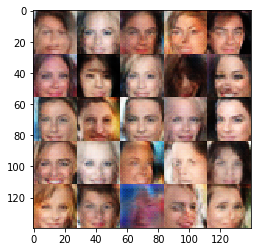

Epoch 3/3... Discriminator Loss: 1.4150... Generator Loss: 0.8706
Epoch 3/3... Discriminator Loss: 1.3583... Generator Loss: 0.7898


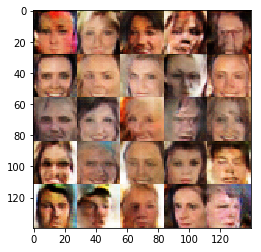

Epoch 3/3... Discriminator Loss: 1.3749... Generator Loss: 0.8045
Epoch 3/3... Discriminator Loss: 1.3162... Generator Loss: 0.8309


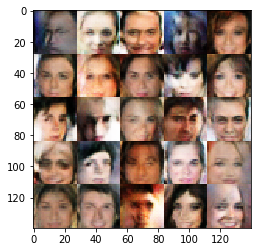

Epoch 3/3... Discriminator Loss: 1.2985... Generator Loss: 0.8591
Epoch 3/3... Discriminator Loss: 1.4074... Generator Loss: 0.7554


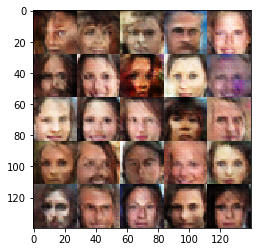

Epoch 3/3... Discriminator Loss: 1.3188... Generator Loss: 0.7863
Epoch 3/3... Discriminator Loss: 1.2809... Generator Loss: 0.8434


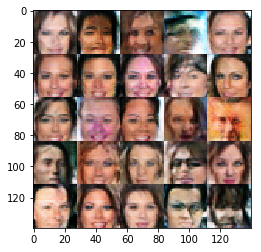

Epoch 3/3... Discriminator Loss: 1.3120... Generator Loss: 0.8716
Epoch 3/3... Discriminator Loss: 1.3493... Generator Loss: 0.7493


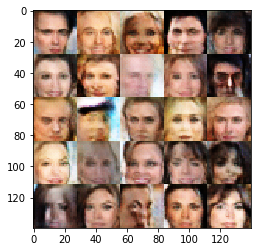

Epoch 3/3... Discriminator Loss: 1.4110... Generator Loss: 0.9553
Epoch 3/3... Discriminator Loss: 1.3657... Generator Loss: 0.8302


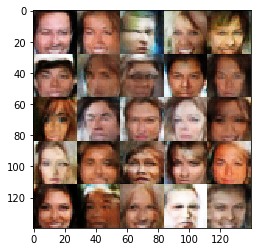

Epoch 3/3... Discriminator Loss: 1.3268... Generator Loss: 0.8358
Epoch 3/3... Discriminator Loss: 1.3370... Generator Loss: 0.9509


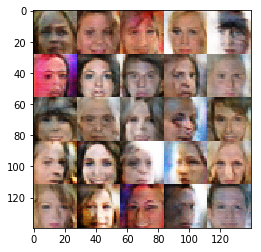

Epoch 3/3... Discriminator Loss: 1.2245... Generator Loss: 0.8315
Epoch 3/3... Discriminator Loss: 1.3983... Generator Loss: 0.8234


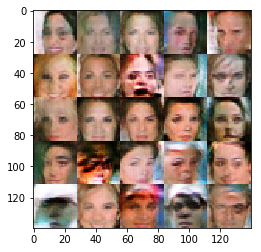

Epoch 3/3... Discriminator Loss: 1.3901... Generator Loss: 0.8515
Epoch 3/3... Discriminator Loss: 1.2913... Generator Loss: 0.9006


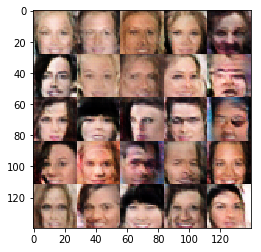

Epoch 3/3... Discriminator Loss: 1.3981... Generator Loss: 0.8007


In [12]:
batch_size = 32
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 3

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    losses = train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
                   celeba_dataset.shape, celeba_dataset.image_mode)

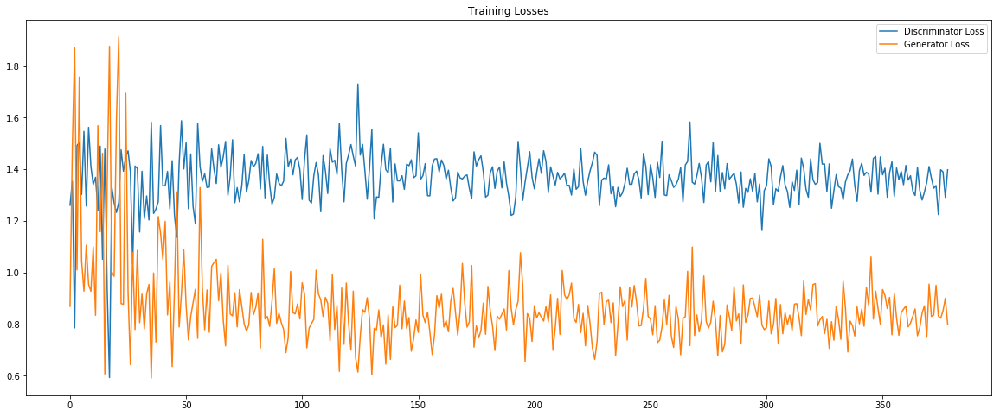

In [13]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(20,8))
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator Loss')
plt.plot(losses.T[1], label='Generator Loss')
plt.title("Training Losses")
plt.legend()

### 提交项目
提交本项目前，确保运行所有 cells 后保存该文件。

保存该文件为 "dlnd_face_generation.ipynb"， 并另存为 HTML 格式 "File" -> "Download as"。提交项目时请附带 "helper.py" 和 "problem_unittests.py" 文件。